In [1]:
import sys
sys.path.append('../src')

In [2]:
from data.ingestion import load_car_sales_data
from data.preparation import generate_datasets
from evaluation.key_performance_indicators import kpi_ml
import pandas as pd

In [3]:
# Load car sales data
car_sales_df = load_car_sales_data("../data/norway_new_car_sales_by_make.csv")
X_train, y_train, X_test, y_test = generate_datasets(
    df=car_sales_df,
    x_length=12,
    y_length=1,
    test_loops=12
)

In [4]:
from xgboost.sklearn import XGBRegressor
import xgboost as xgb

<Axes: title={'center': 'Feature importance'}, xlabel='Importance score', ylabel='Features'>

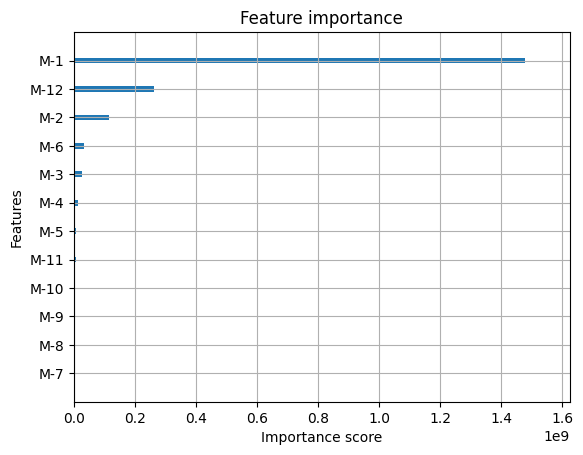

In [5]:
xgb_reg = XGBRegressor(
    n_jobs=-1,
    max_depth=10,
    n_estimators=100,
    learning_rate=0.2,
)
xgb_reg.fit(X=X_train, y=y_train)
xgb_reg.get_booster().feature_names = [f"M{x - 12}" for x in range(12)]
xgb.plot_importance(
    xgb_reg,
    importance_type="total_gain",
    show_values=False,
)

In [6]:
from sklearn.multioutput import MultiOutputRegressor

In [7]:
# Multiple output regression
X_train, y_train, X_test, y_test = generate_datasets(
    df=car_sales_df,
    x_length=12,
    y_length=6,
    test_loops=12
)
xgb_reg = XGBRegressor(
    n_jobs=1,
    max_depth=10,
    n_estimators=100,
    learning_rate=0.2,
)
multi = MultiOutputRegressor(estimator=xgb_reg, n_jobs=-1)
multi.fit(X=X_train, y=y_train)
# Future forecast
X_train, y_train, X_test, y_test = generate_datasets(
    df=car_sales_df,
    x_length=12,
    y_length=6,
    test_loops=0
)
multi.fit(X=X_train, y=y_train)
forecast_df = pd.DataFrame(
    data=multi.predict(X=X_test),
    index=car_sales_df.index
)
print(forecast_df)


                        0            1            2            3            4  \
Make                                                                            
Alfa Romeo      10.184089     8.149643     7.404906     9.503287    11.133018   
Aston Martin     0.190329     0.682681     0.191748     0.093967     0.176659   
Audi           733.652588   742.841309   594.797241   659.938660   743.312378   
BMW           1060.885254  1101.544800  1228.265137  1222.016724   929.175598   
Bentley          0.166028     0.284376     0.311742     0.516105     0.599086   
...                   ...          ...          ...          ...          ...   
Think            0.066489     0.091256     0.096553     0.114252     0.143166   
Toyota        1530.518921  1568.814697  1486.133057  1495.750122  1528.117310   
Volkswagen    2136.344727  2228.623047  2955.275146  2247.351074  2247.968994   
Volvo          912.085144   831.598450   833.813232   880.864624   925.903564   
Westfield        0.066489   

In [8]:
from sklearn.model_selection import train_test_split

In [9]:
# Early stopping
x_train, x_val, y_train, y_val = train_test_split(
    X_train,
    y_train,
    test_size=0.15,
)

xgb_reg = XGBRegressor(
    n_jobs=-1,
    max_depth=10,
    n_estimators=1000,
    learning_rate=0.01,
    early_stopping_rounds=100,
    eval_metric="mae",
)
xgb_reg.fit(
    X=x_train,
    y=y_train,
    eval_set=[(x_val, y_val)],
    verbose=True,
)

[0]	validation_0-mae:233.07140
[1]	validation_0-mae:230.81680
[2]	validation_0-mae:228.59447
[3]	validation_0-mae:226.38609
[4]	validation_0-mae:224.20647
[5]	validation_0-mae:222.05619
[6]	validation_0-mae:219.92333
[7]	validation_0-mae:217.81046
[8]	validation_0-mae:215.72049
[9]	validation_0-mae:213.65061
[10]	validation_0-mae:211.60273
[11]	validation_0-mae:209.57872
[12]	validation_0-mae:207.58024
[13]	validation_0-mae:205.59327
[14]	validation_0-mae:203.62358
[15]	validation_0-mae:201.68445
[16]	validation_0-mae:199.77140
[17]	validation_0-mae:197.86947
[18]	validation_0-mae:195.99949
[19]	validation_0-mae:194.14545
[20]	validation_0-mae:192.30166
[21]	validation_0-mae:190.48740
[22]	validation_0-mae:188.68981
[23]	validation_0-mae:186.91064
[24]	validation_0-mae:185.14586
[25]	validation_0-mae:183.41101
[26]	validation_0-mae:181.69837
[27]	validation_0-mae:180.00407
[28]	validation_0-mae:178.32774
[29]	validation_0-mae:176.65823
[30]	validation_0-mae:175.02075
[31]	validation_0-

,objective,'reg:squarederror'
,base_score,None
,booster,None
,callbacks,None
,colsample_bylevel,None
,colsample_bynode,None
,colsample_bytree,None
,device,None
,early_stopping_rounds,100
,enable_categorical,False
,eval_metric,'mae'


In [10]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import TimeSeriesSplit

In [12]:
# Hyperparameter optimization for XGBRegressor
X_train, y_train, X_test, y_test = generate_datasets(
    df=car_sales_df,
    x_length=12,
    y_length=6,
    test_loops=12
)
X_train, X_val, y_train, y_val = train_test_split(
    X_train,
    y_train,
    test_size=0.15,
)
param_dist = {
    "max_depth": [5, 6, 7, 8, 10, 11],
    "learning_rate": [0.005, 0.01, 0.025, 0.05, 0.1, 0.15],
    "colsample_bynode": [0.5, 0.6, 0.7, 0.8, 0.9, 1.0],
    "colsample_bylevel": [0.8, 0.9, 1.0],
    "colsample_bytree": [0.6, 0.7, 0.8, 0.9, 1.0],
    "subsample": [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7],
    "min_child_weight": [5, 10, 15, 20, 25],
    "reg_alpha": [1, 5, 10, 20, 50],
    "reg_lambda": [0.01, 0.05, 0.1, 0.5, 1.0],
    "n_estimators": [100],
}
xgb_reg = XGBRegressor(
    n_jobs=1,
    early_stopping_rounds=25,
    eval_metric="mae",
)
xgb_cv = RandomizedSearchCV(
    estimator=xgb_reg,
    param_distributions=param_dist,
    n_jobs=-1,
    cv=TimeSeriesSplit(n_splits=5),
    n_iter=1000,
    scoring="neg_mean_absolute_error",
)
xgb_cv.fit(X=X_train, y=y_train, eval_set=[(X_val, y_val)])
print(f"Best parameters: {xgb_cv.best_params_}")


[0]	validation_0-mae:196.02654
[1]	validation_0-mae:168.55930
[2]	validation_0-mae:145.24038
[3]	validation_0-mae:125.80373
[0]	validation_0-mae:196.73521
[4]	validation_0-mae:109.67142
[0]	validation_0-mae:192.39547
[1]	validation_0-mae:168.84710
[5]	validation_0-mae:96.34158
[1]	validation_0-mae:165.34425
[2]	validation_0-mae:145.31655
[6]	validation_0-mae:85.26721
[2]	validation_0-mae:142.14450
[7]	validation_0-mae:76.23759
[3]	validation_0-mae:125.76869
[0]	validation_0-mae:192.80448
[8]	validation_0-mae:69.01101
[4]	validation_0-mae:109.55063
[3]	validation_0-mae:122.65599
[1]	validation_0-mae:164.91712
[0]	validation_0-mae:222.85200
[9]	validation_0-mae:63.08416
[5]	validation_0-mae:96.30493
[4]	validation_0-mae:106.54414
[1]	validation_0-mae:217.41583
[2]	validation_0-mae:141.69176
[10]	validation_0-mae:58.17838
[6]	validation_0-mae:85.24741
[0]	validation_0-mae:193.15709
[5]	validation_0-mae:93.42143
[11]	validation_0-mae:54.42424
[2]	validation_0-mae:212.10470
[7]	validation_0

In [14]:
X_train, y_train, X_test, y_test = generate_datasets(
    df=car_sales_df,
    x_length=12,
    y_length=6,
    test_loops=12
)
X_train, X_val, y_train, y_val = train_test_split(
    X_train,
    y_train,
    test_size=0.15,
)
best_params = {
    'subsample': 0.6,
    'reg_lambda': 0.5,
    'reg_alpha': 50,
    'n_estimators': 100,
    'min_child_weight': 15,
    'max_depth': 10,
    'learning_rate': 0.05,
    'colsample_bytree': 0.6,
    'colsample_bynode': 0.9,
    'colsample_bylevel': 0.9
}
xgb_reg = XGBRegressor(
    n_jobs=-1,
    early_stopping_rounds=25,
    eval_metric="mae",
    **best_params
)
xgb_reg.fit(X=X_train, y=y_train, eval_set=[(X_val, y_val)])
y_train_pred = xgb_reg.predict(X=X_train)
y_test_pred = xgb_reg.predict(X=X_test)

kpi_ml(
    y_train=y_train,
    y_train_pred=y_train_pred,
    y_test=y_test,
    y_test_pred=y_test_pred,
    name="XGBoost Regressor",
)

[0]	validation_0-mae:220.90732
[1]	validation_0-mae:210.46293
[2]	validation_0-mae:200.58233
[3]	validation_0-mae:191.09715
[4]	validation_0-mae:182.14018
[5]	validation_0-mae:173.61203
[6]	validation_0-mae:165.63351
[7]	validation_0-mae:158.06776
[8]	validation_0-mae:150.90041
[9]	validation_0-mae:144.04015
[10]	validation_0-mae:137.58557
[11]	validation_0-mae:131.46938
[12]	validation_0-mae:125.69125
[13]	validation_0-mae:120.19064
[14]	validation_0-mae:115.06568
[15]	validation_0-mae:110.19985
[16]	validation_0-mae:105.55636
[17]	validation_0-mae:101.26364
[18]	validation_0-mae:97.21383
[19]	validation_0-mae:93.38663
[20]	validation_0-mae:89.77399
[21]	validation_0-mae:86.34967
[22]	validation_0-mae:83.11198
[23]	validation_0-mae:80.07819
[24]	validation_0-mae:77.21374
[25]	validation_0-mae:74.51897
[26]	validation_0-mae:71.96508
[27]	validation_0-mae:69.58756
[28]	validation_0-mae:67.38300
[29]	validation_0-mae:65.28464
[30]	validation_0-mae:63.31746
[31]	validation_0-mae:61.51692
